In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
from sklearn.feature_extraction.text import CountVectorizer
import nltk
from nltk.corpus import stopwords
import string

In [ ]:
#load the data
df=pd.read_csv('/content/winemag-data-130k-v2.csv')
#show countries in country column alphabetically
df['country'].sort_values().unique()

array(['Argentina', 'Armenia', 'Australia', 'Austria',
       'Bosnia and Herzegovina', 'Brazil', 'Bulgaria', 'Canada', 'Chile',
       'China', 'Croatia', 'Cyprus', 'Czech Republic', 'Egypt', 'England',
       'France', 'Georgia', 'Germany', 'Greece', 'Hungary', 'India',
       'Israel', 'Italy', 'Lebanon', 'Luxembourg', 'Macedonia', 'Mexico',
       'Moldova', 'Morocco', 'New Zealand', 'Peru', 'Portugal', 'Romania',
       'Serbia', 'Slovakia', 'Slovenia', 'South Africa', 'Spain',
       'Switzerland', 'Turkey', 'US', 'Ukraine', 'Uruguay', nan],
      dtype=object)

In [ ]:
#cleaning data
#remove null rows from country column or description column or province column
df = df.dropna(subset=['country', 'description', 'province'])
#show number of rows afer being cleaned
df.shape
df

,id,country,description,designation,points,price,province,region_1,region_2,taster_name,taster_twitter_handle,title,variety,winery
0,0,Italy,"Aromas include tropical fruit, broom, brimston...",Vulkà Bianco,87,NaN,Sicily & Sardinia,Etna,NaN,Kerin O’Keefe,@kerinokeefe,Nicosia 2013 Vulkà Bianco (Etna),White Blend,Nicosia
1,1,Portugal,"This is ripe and fruity, a wine that is smooth...",Avidagos,87,15.0,Douro,NaN,NaN,Roger Voss,@vossroger,Quinta dos Avidagos 2011 Avidagos Red (Douro),Portuguese Red,Quinta dos Avidagos
2,2,US,"Tart and snappy, the flavors of lime flesh and...",NaN,87,14.0,Oregon,Willamette Valley,Willamette Valley,Paul Gregutt,@paulgwine,Rainstorm 2013 Pinot Gris (Willamette Valley),Pinot Gris,Rainstorm
3,3,US,"Pineapple rind, lemon pith and orange blossom ...",Reserve Late Harvest,87,13.0,Michigan,Lake Michigan Shore,NaN,Alexander Peartree,NaN,St. Julian 2013 Reserve Late Harvest Riesling ...,Riesling,St. Julian
4,4,US,"Much like the regular bottling from 2012, this...",Vintner's Reserve Wild Child Block,87,65.0,Oregon,Willamette Valley,Willamette Valley,Paul Gregutt,@paulgwine,Sweet Cheeks 2012 Vintner's Reserve Wild Child...,Pinot Noir,Sweet Cheeks
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129966,129966,Germany,Notes of honeysuckle and cantaloupe sweeten th...,Brauneberger Juffer-Sonnenuhr Spätlese,90,28.0,Mosel,NaN,NaN,Anna Lee C. Iijima,NaN,Dr. H. Thanisch (Erben Müller-Burggraef) 2013 ...,Riesling,Dr. H. Thanisch (Erben Müller-Burggraef)
129967,129967,US,Citation is given as much as a decade of bottl...,NaN,90,75.0,Oregon,Oregon,Oregon Other,Paul Gregutt,@paulgwine,Citation 2004 Pinot Noir (Oregon),Pinot Noir,Citation
129968,129968,France,Well-drained gravel soil gives this wine its c...,Kritt,90,30.0,Alsace,Alsace,NaN,Roger Voss,@vossroger,Domaine Gresser 2013 Kritt Gewurztraminer (Als...,Gewürztraminer,Domaine Gresser
129969,129969,France,"A dry style of Pinot Gris, this is crisp with ...",NaN,90,32.0,Alsace,Alsace,NaN,Roger Voss,@vossroger,Domaine Marcel Deiss 2012 Pinot Gris (Alsace),Pinot Gris,Domaine Marcel Deiss


In [ ]:
#standardize text in description column
df['description'] = df['description'].str.lower() #converting all smaller cases
df['description'] = df['description'].str.replace('[^\w\s]', '') #removing special characters
df['description'] = df['description'].str.replace('\d+', '') #removing numbers
df['description'] = df['description'].str.replace('\s+', ' ') #removing extra spaces
df['description'] = df['description'].str.strip() #removing leading and trailing spaces
df['description']

,description
0,"aromas include tropical fruit, broom, brimston..."
1,"this is ripe and fruity, a wine that is smooth..."
2,"tart and snappy, the flavors of lime flesh and..."
3,"pineapple rind, lemon pith and orange blossom ..."
4,"much like the regular bottling from 2012, this..."
...,...
129966,notes of honeysuckle and cantaloupe sweeten th...
129967,citation is given as much as a decade of bottl...
129968,well-drained gravel soil gives this wine its c...
129969,"a dry style of pinot gris, this is crisp with ..."


In [ ]:
#removing filler words in description column
nltk.download('stopwords')
stop_words = set(stopwords.words('english'))
df['description'] = df['description'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop_words)]))
df
df['description']

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


,description
0,"aromas include tropical fruit, broom, brimston..."
1,"ripe fruity, wine smooth still structured. fir..."
2,"tart snappy, flavors lime flesh rind dominate...."
3,"pineapple rind, lemon pith orange blossom star..."
4,"much like regular bottling 2012, comes across ..."
...,...
129966,notes honeysuckle cantaloupe sweeten delicious...
129967,citation given much decade bottle age prior re...
129968,well-drained gravel soil gives wine crisp dry ...
129969,"dry style pinot gris, crisp acidity. also weig..."


In [ ]:
#tokenize the texts in description column
df['description'] = df['description'].apply(lambda x: x.split())
df['description']

,description
0,"[aromas, include, tropical, fruit,, broom,, br..."
1,"[ripe, fruity,, wine, smooth, still, structure..."
2,"[tart, snappy,, flavors, lime, flesh, rind, do..."
3,"[pineapple, rind,, lemon, pith, orange, blosso..."
4,"[much, like, regular, bottling, 2012,, comes, ..."
...,...
129966,"[notes, honeysuckle, cantaloupe, sweeten, deli..."
129967,"[citation, given, much, decade, bottle, age, p..."
129968,"[well-drained, gravel, soil, gives, wine, cris..."
129969,"[dry, style, pinot, gris,, crisp, acidity., al..."


In [ ]:
#combine text for each country
df_grouped = df.groupby('country')['description'].apply(lambda x: ' '.join(str(i) for i in x))
df_grouped

,description
country,
Argentina,"['baked', 'plum,', 'molasses,', 'balsamic', 'v..."
Armenia,"['medium', 'straw', 'glass,', 'wine', 'nose', ..."
Australia,"['medium-bodied', 'chardonnay', 'features', 'a..."
Austria,"['freshness', 'characterizes', 'nose:', 'green..."
Bosnia and Herzegovina,"['toasted', 'oak', 'cedar', 'notes', 'meld', '..."
Brazil,"['pear,', 'apple', 'wet-stone', 'aromas', 'tig..."
Bulgaria,"['pale-pink', 'rosé', 'comprised', '70%', 'pin..."
Canada,"['aromatic', 'knockout', 'notes', 'peach,', 'p..."
Chile,"['white', 'flower,', 'lychee', 'apple', 'aroma..."


In [ ]:
#Remove a few words from description 'flavor', 'aroma', 'finish'
df_grouped = df_grouped.str.replace('flavor', '')
df_grouped = df_grouped.str.replace('aroma', '')
df_grouped = df_grouped.str.replace('finish', '')
df_grouped


,description
country,
Argentina,"['baked', 'plum,', 'molasses,', 'balsamic', 'v..."
Armenia,"['medium', 'straw', 'glass,', 'wine', 'nose', ..."
Australia,"['medium-bodied', 'chardonnay', 'features', 's..."
Austria,"['freshness', 'characterizes', 'nose:', 'green..."
Bosnia and Herzegovina,"['toasted', 'oak', 'cedar', 'notes', 'meld', '..."
Brazil,"['pear,', 'apple', 'wet-stone', 's', 'tight,',..."
Bulgaria,"['pale-pink', 'rosé', 'comprised', '70%', 'pin..."
Canada,"['tic', 'knockout', 'notes', 'peach,', 'papaya..."
Chile,"['white', 'flower,', 'lychee', 'apple', 's', '..."


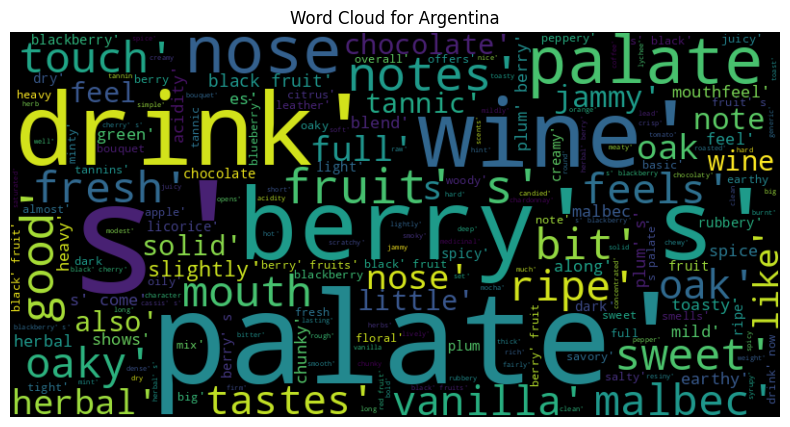

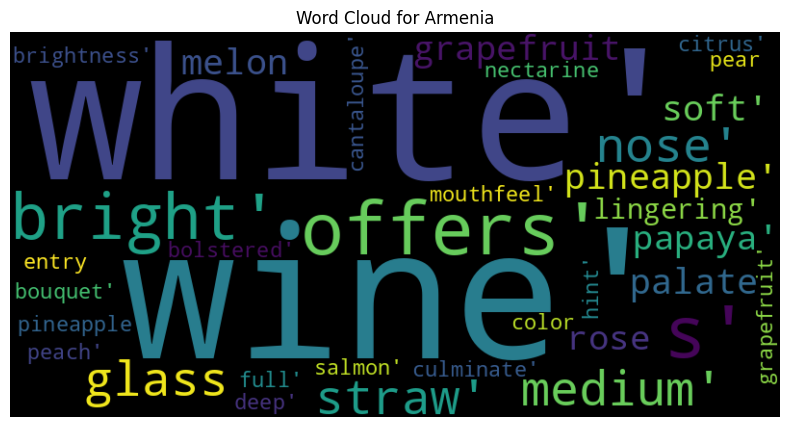

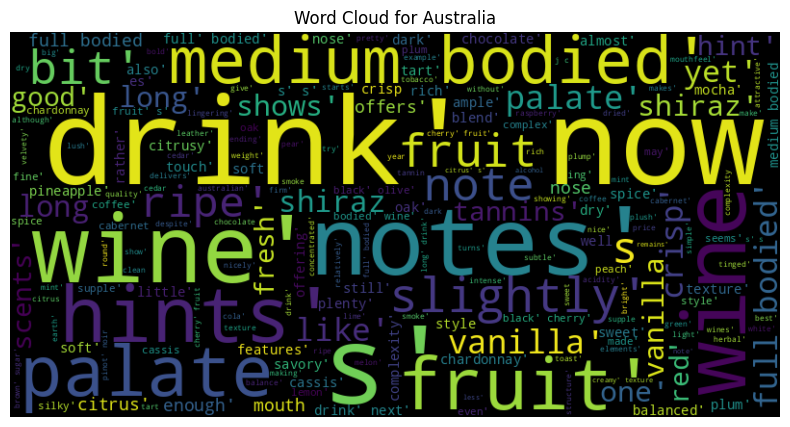

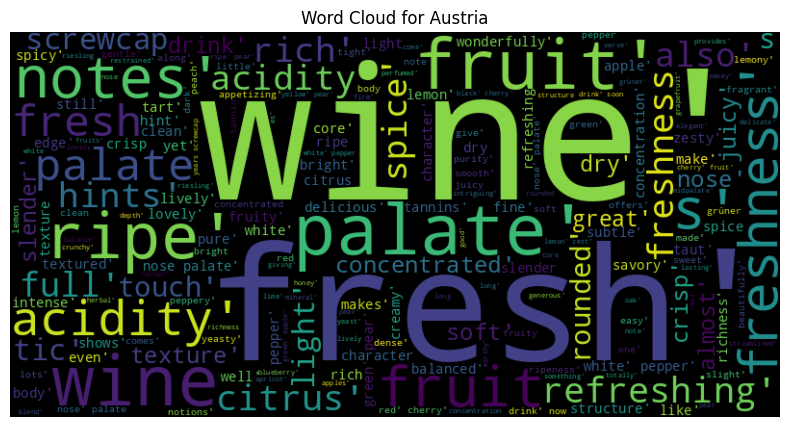

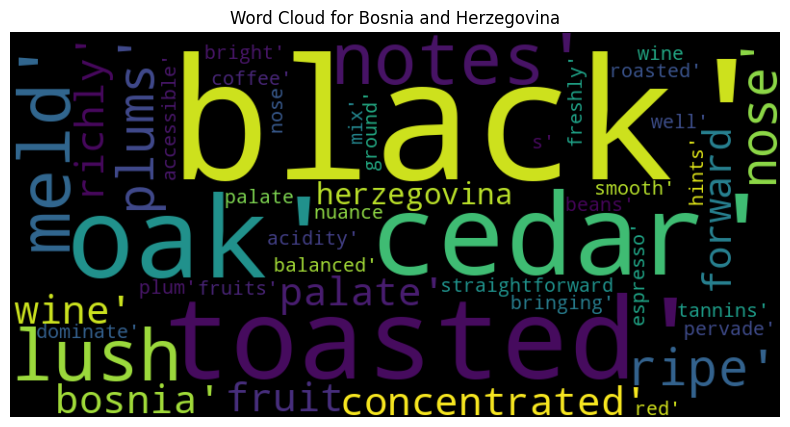

...

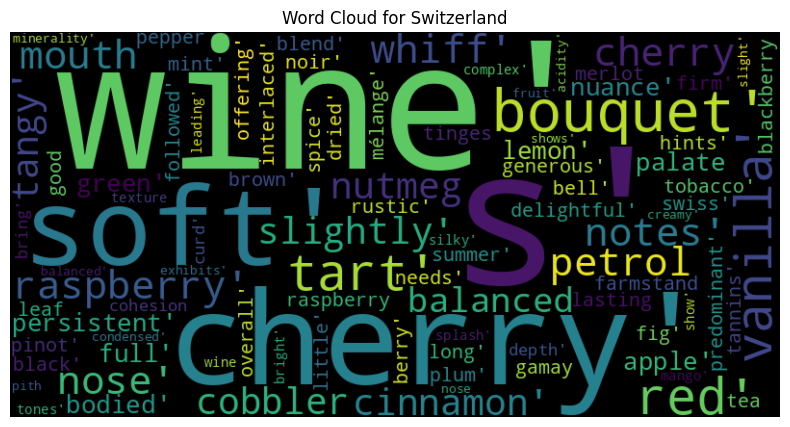

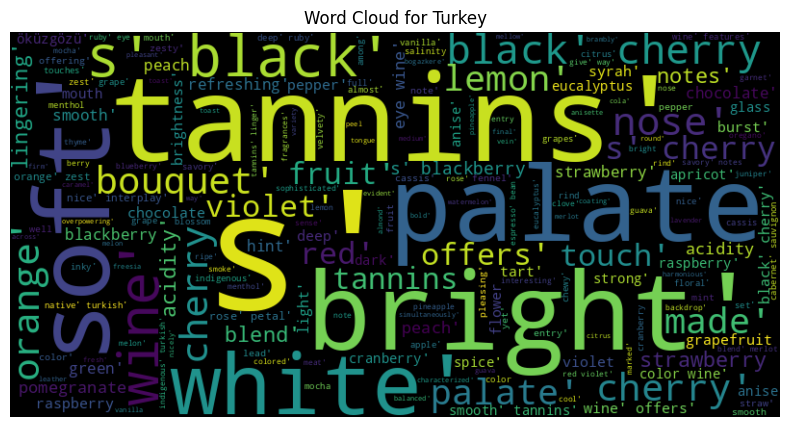

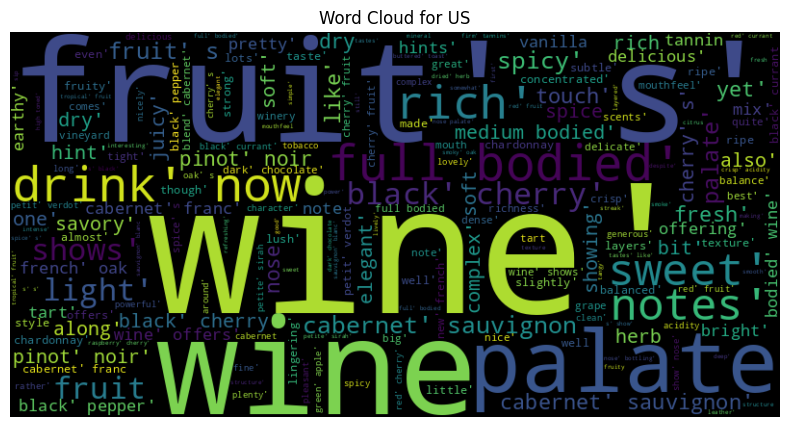

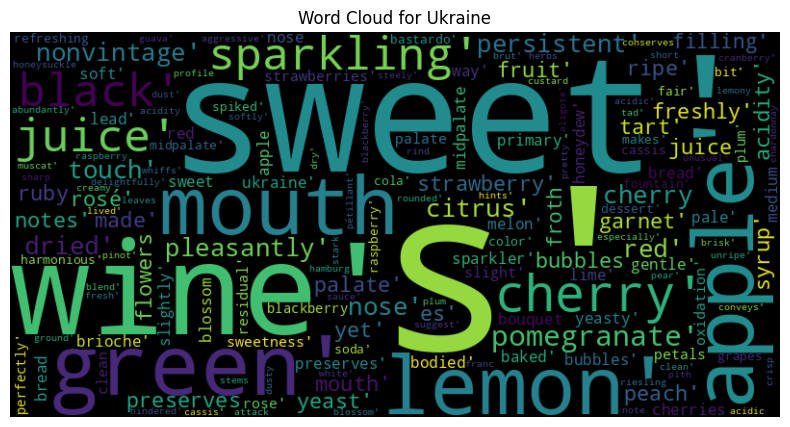

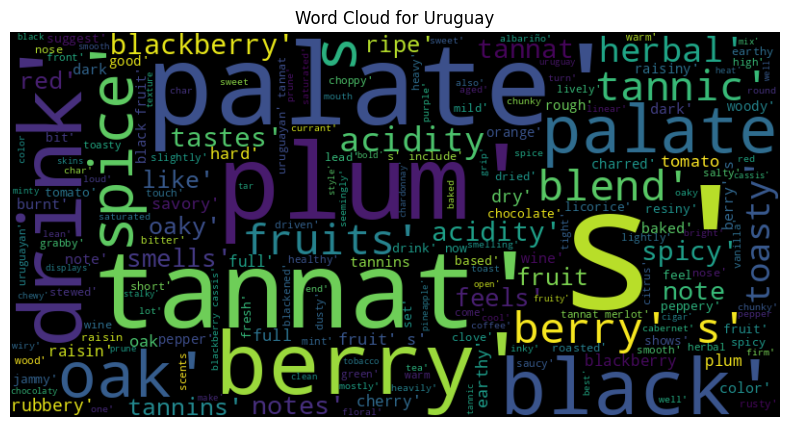

In [ ]:
#create a word cloud for each country
for country, description in df_grouped.items():
    wordcloud = WordCloud(width=800, height=400).generate(description)
    plt.figure(figsize=(10,5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.title(f"Word Cloud for {country}")
    plt.show()

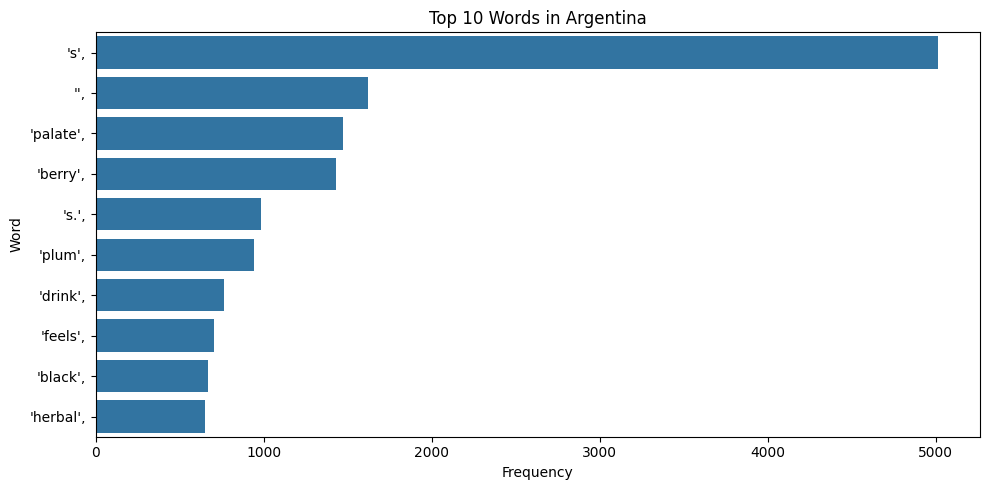

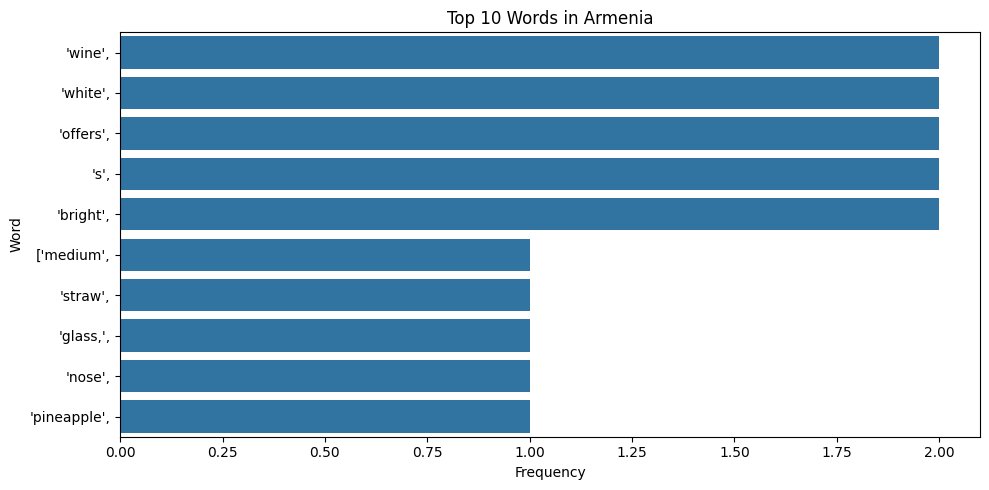

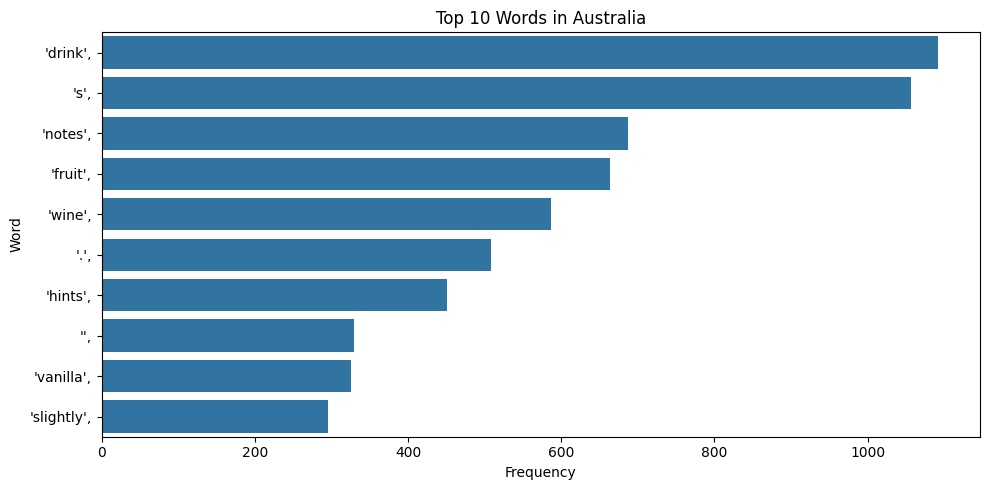

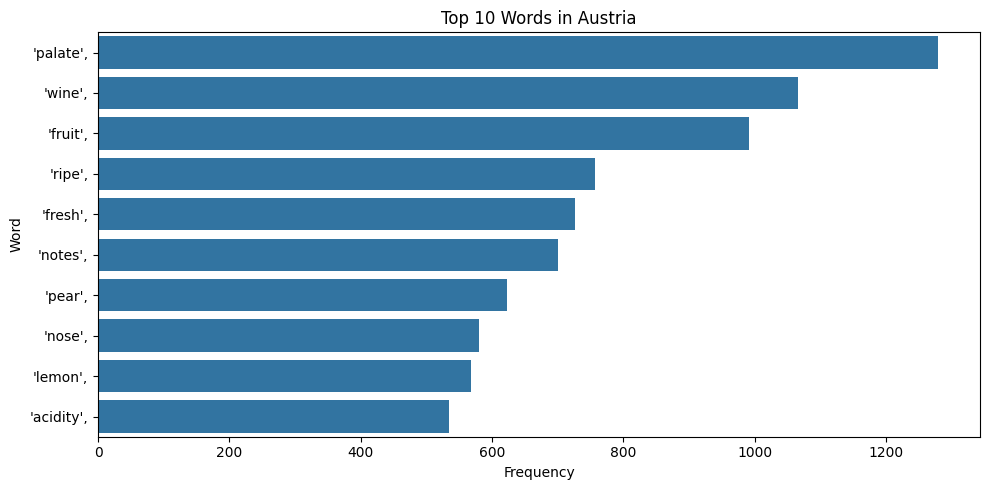

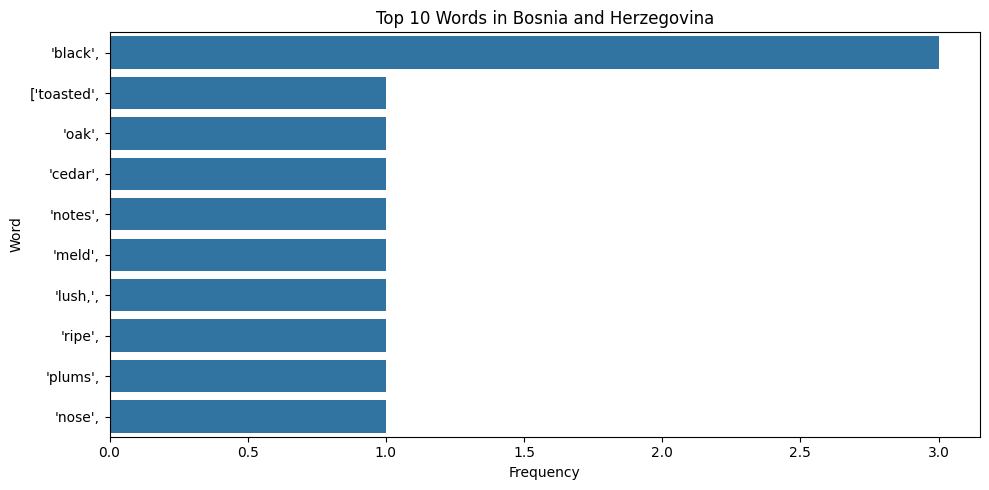

...

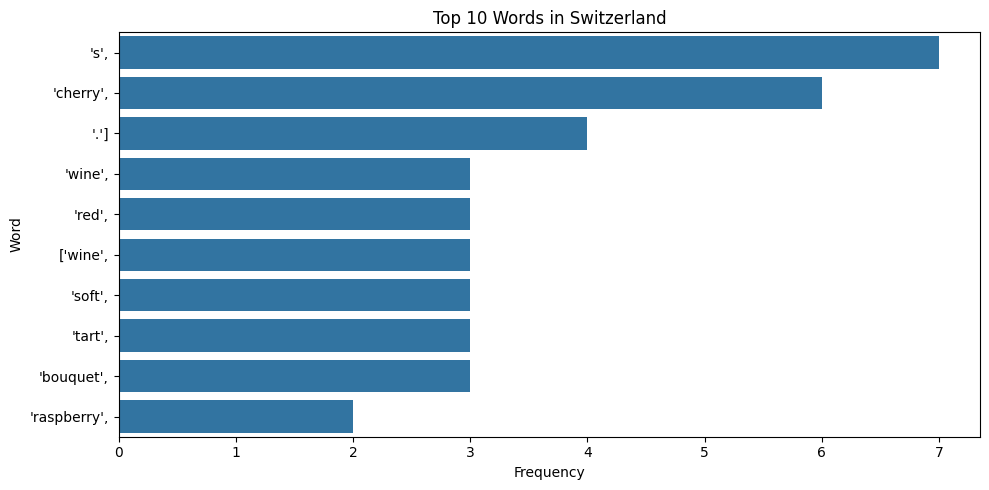

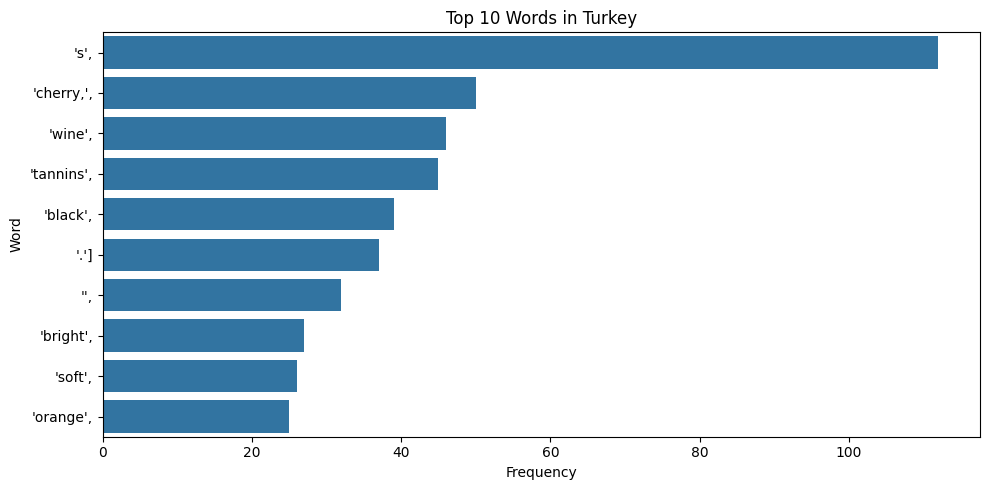

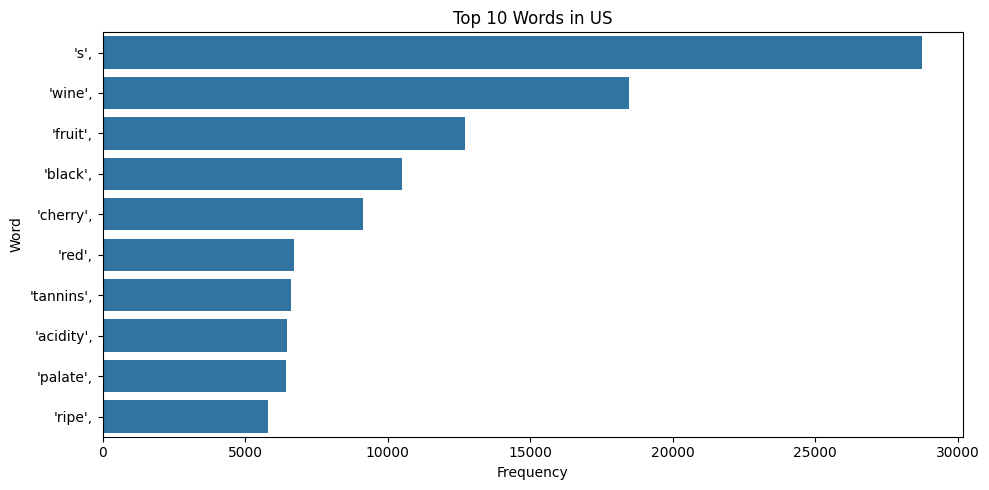

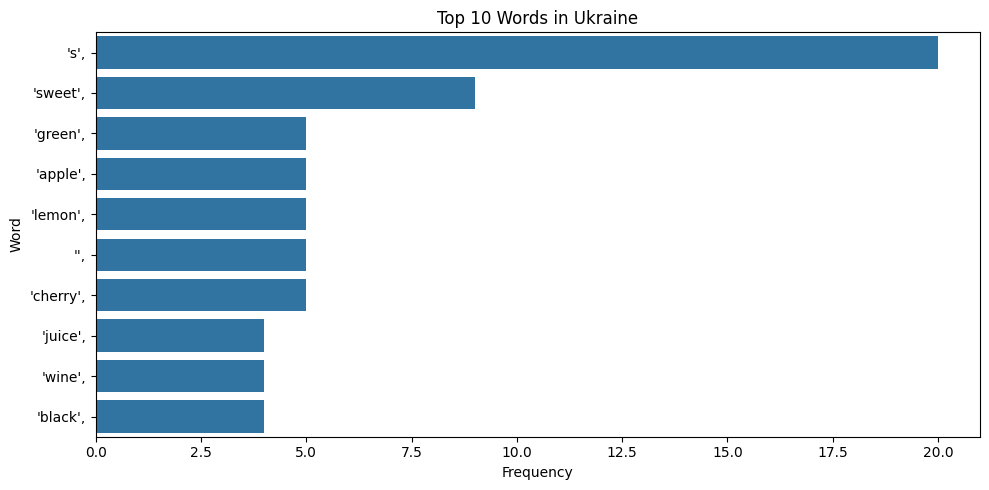

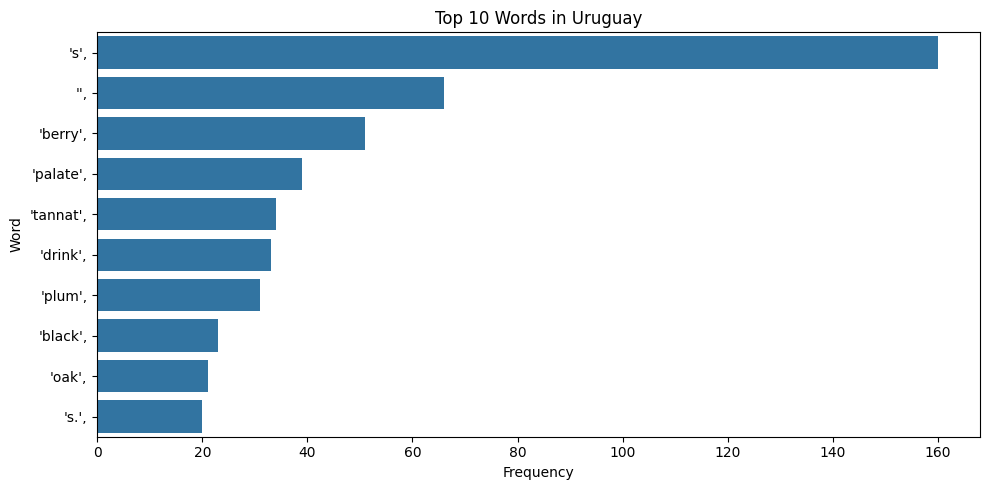

In [ ]:
from collections import Counter

# Set how many top words to display
TOP_N = 10

# Loop through each country
for country, text in df_grouped.items():
    # Tokenize text
    words = text.split()

    # Count word frequencies
    word_freq = Counter(words)
    common_words = word_freq.most_common(TOP_N)

    # Create DataFrame for plotting
    freq_df = pd.DataFrame(common_words, columns=['Word', 'Frequency'])

    # Plot bar chart
    plt.figure(figsize=(10,5))
    sns.barplot(x='Frequency', y='Word', data=freq_df)
    plt.title(f"Top {TOP_N} Words in {country}")
    plt.xlabel("Frequency")
    plt.ylabel("Word")
    plt.tight_layout()
    plt.show()

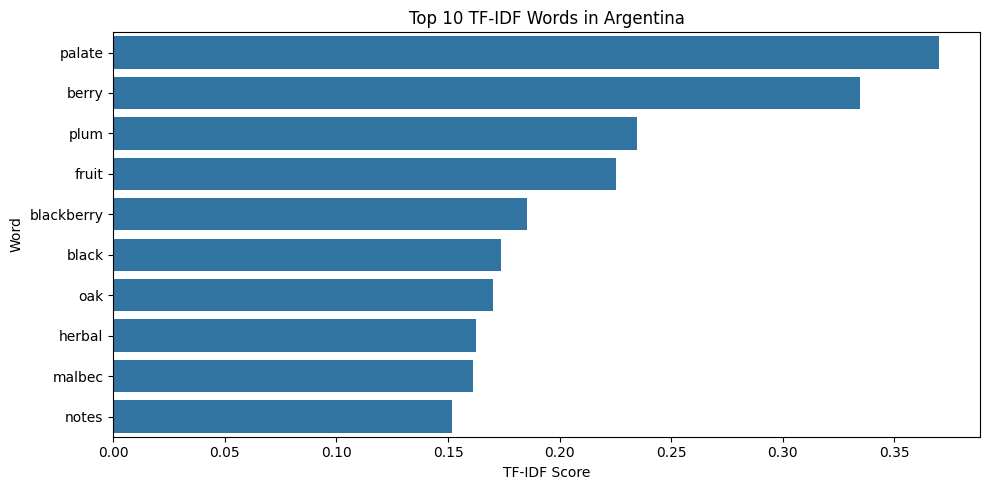

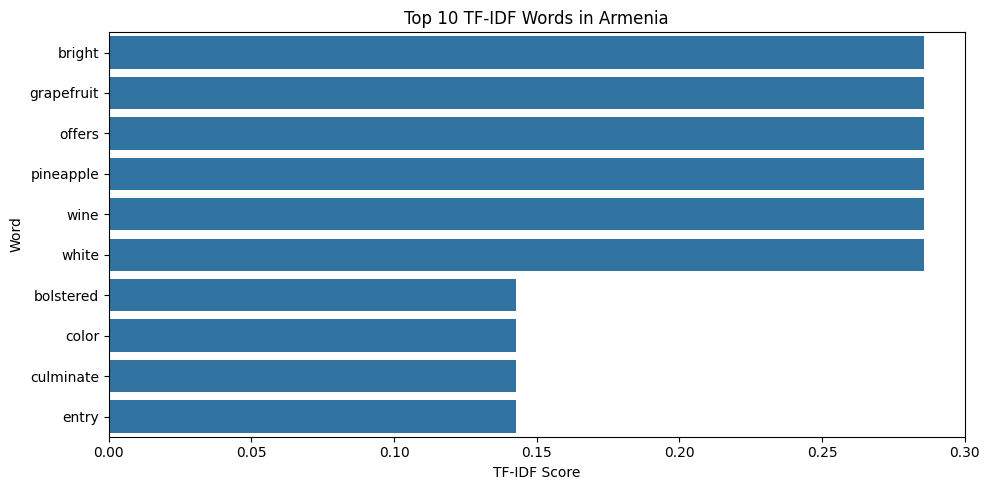

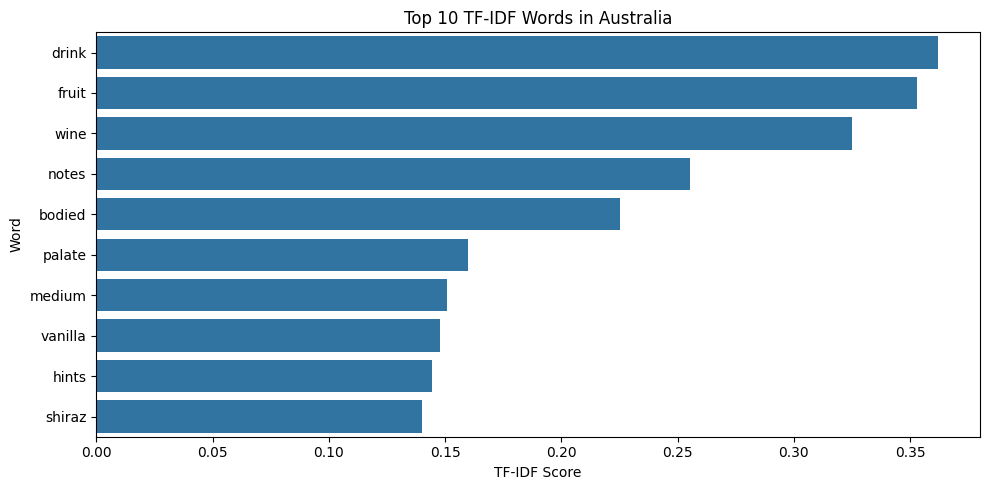

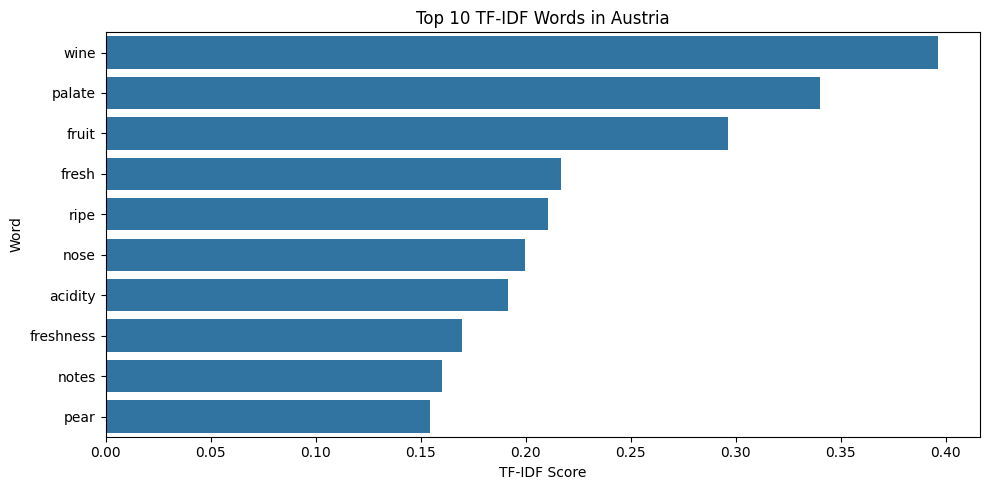

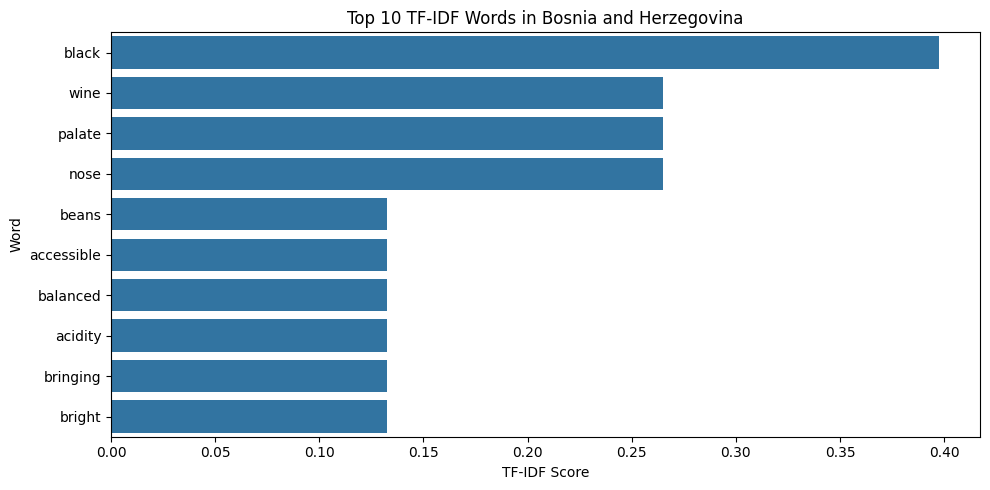

...

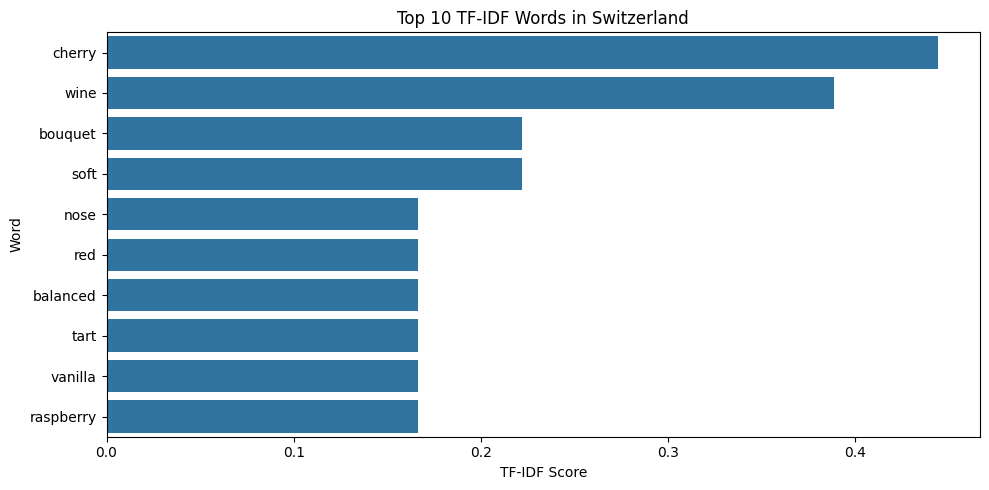

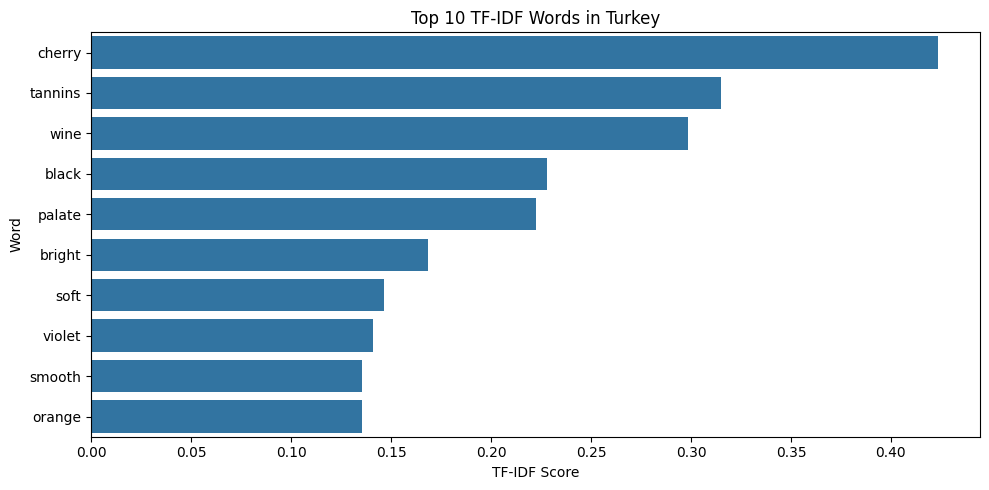

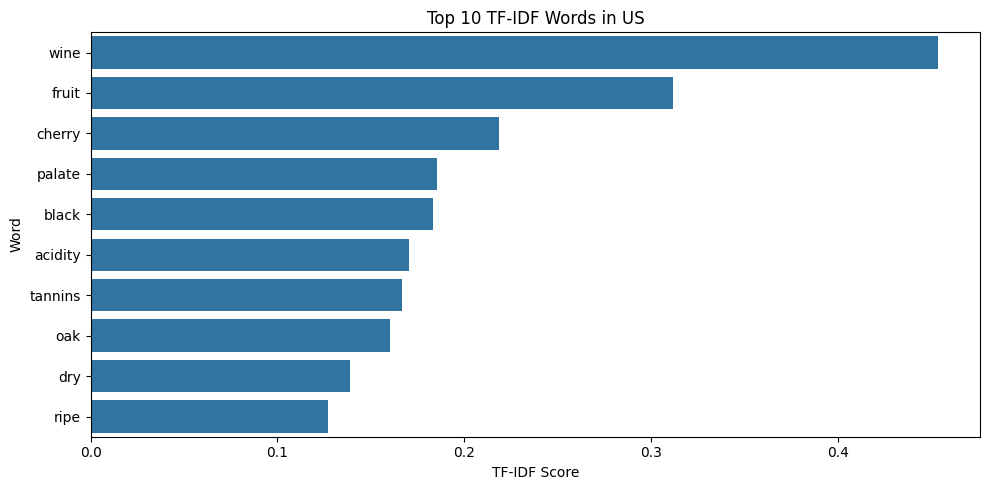

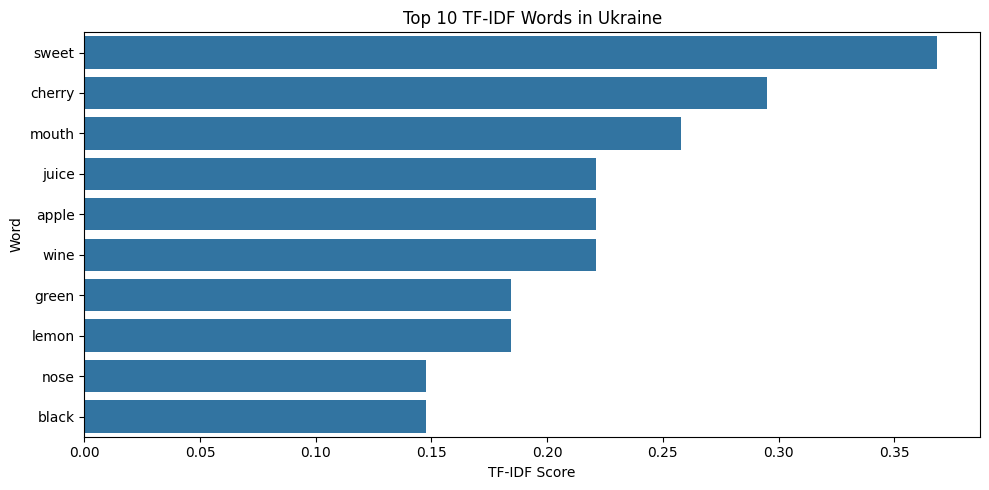

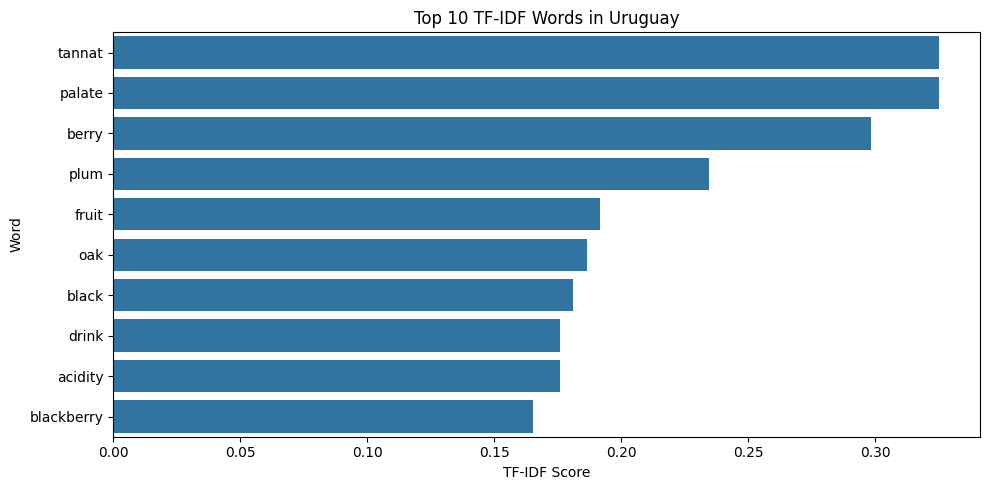

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Set number of top words
TOP_N = 10

# Loop through each country
for country, text in df_grouped.items():
    # Use the country description as one document
    corpus = [text]

    # Create TF-IDF vectorizer
    vectorizer = TfidfVectorizer(stop_words='english')
    tfidf_matrix = vectorizer.fit_transform(corpus)

    # Get feature names and scores
    feature_names = vectorizer.get_feature_names_out()
    scores = tfidf_matrix.toarray().flatten()

    # Create a DataFrame of word scores
    tfidf_df = pd.DataFrame({'Word': feature_names, 'TFIDF': scores})
    tfidf_df = tfidf_df.sort_values(by='TFIDF', ascending=False).head(TOP_N)

    # Plot
    plt.figure(figsize=(10, 5))
    sns.barplot(x='TFIDF', y='Word', data=tfidf_df)
    plt.title(f"Top {TOP_N} TF-IDF Words in {country}")
    plt.xlabel("TF-IDF Score")
    plt.ylabel("Word")
    plt.tight_layout()
    plt.show()


In [ ]:
#export tf-idf wordlist with country column to one excel
import pandas as pd

# Create an empty DataFrame to store the results
result_df = pd.DataFrame()

# Loop through each country
for country, text in df_grouped.items():
    # Use the country description as one document
    corpus = [text]

    # Create TF-IDF vectorizer
    vectorizer = TfidfVectorizer(stop_words='english')
    tfidf_matrix = vectorizer.fit_transform(corpus)

    # Get feature names and scores
    feature_names = vectorizer.get_feature_names_out()
    scores = tfidf_matrix.toarray().flatten()

    # Create a DataFrame of word scores
    tfidf_df = pd.DataFrame({'Word': feature_names, 'TFIDF': scores})
    tfidf_df = tfidf_df.sort_values(by='TFIDF', ascending=False)

    # Add country column
    tfidf_df['Country'] = country

    # Append to the result DataFrame
    result_df = pd.concat([result_df, tfidf_df], ignore_index=True)

# Save the result DataFrame to an Excel file
result_df.to_excel('tfidf_wordlist.xlsx', index=False)